# Task 1

## Download the dataset
(https://docs.google.com/spreadsheets/d/1GTwv07i98vL7S-J9eeP8NV1fJVnymm1eJ31RDyt4Mxw/edit?usp=sharing)

In [1]:
# Importing the data file and creating a pandas df
from google.colab import files
uploaded = files.upload()

Saving keyword_data.csv to keyword_data.csv


In [2]:
import pandas as pd
import numpy as np

keyword_data = pd.read_csv('keyword_data.csv')
keyword_data.shape

(66, 13)

In [3]:
# Previewing data
keyword_data.head()

,Title,Keyword 1,Keyword 2,Keyword 3,Keyword 4,Keyword 5,Keyword 6,Keyword 7,Keyword 8,Keyword 9,Keyword 10,Keyword 11,Keyword 12
0,Feb-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Meta-Analyses of Financial Performance and Equ...,EQUITY,ORGANIZATIONAL sociology,PERFORMANCE,META-analysis,PSYCHOMETRICS,ORGANIZATIONAL research,FINANCIAL performance,AGENCY theory,ORGANIZATIONAL effectiveness,ORGANIZATIONAL behavior,CORPORATE governance,NaN
3,"Home Country Environments, Corporate Diversifi...",DIVERSIFICATION in industry,BUSINESS planning,PERFORMANCE standards,EMPLOYEES -- Rating of,CORPORATE culture,STRATEGIC planning,ORGANIZATIONAL effectiveness,MANAGEMENT science,MANAGEMENT research,PRODUCT management,NaN,NaN
4,Safeguarding Investments in Asymmetric Interor...,INTERORGANIZATIONAL relations,INTERGROUP relations,BUSINESS communication,INVESTMENTS,SUPPLY chains,KNOWLEDGE management,INTERORGANIZATIONAL networks,CORPORATE governance,GROUP decision making,INTELLECTUAL capital,NaN,NaN


## Cleaning the dataset 

In [4]:
### Filtering out empty rows

keyword_data = keyword_data[keyword_data['Title'].notnull()]
keyword_data.shape

(55, 13)

In [5]:
# Filtering out rows that have date values in Title
keyword_data['all_keywords'] = keyword_data['Keyword 1'].fillna('') + keyword_data['Keyword 2'].fillna('') + keyword_data['Keyword 3'].fillna('') + keyword_data['Keyword 4'].fillna('') + keyword_data['Keyword 5'].fillna('') + keyword_data['Keyword 6'].fillna('') + keyword_data['Keyword 7'].fillna('') + keyword_data['Keyword 8'].fillna('') + keyword_data['Keyword 9'].fillna('') + keyword_data['Keyword 10'].fillna('') + keyword_data['Keyword 11'].fillna('') + keyword_data['Keyword 12'].fillna('')

<ipython-input-5-9fcc9b90e201>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  keyword_data['all_keywords'] = keyword_data['Keyword 1'].fillna('') + keyword_data['Keyword 2'].fillna('') + keyword_data['Keyword 3'].fillna('') + keyword_data['Keyword 4'].fillna('') + keyword_data['Keyword 5'].fillna('') + keyword_data['Keyword 6'].fillna('') + keyword_data['Keyword 7'].fillna('') + keyword_data['Keyword 8'].fillna('') + keyword_data['Keyword 9'].fillna('') + keyword_data['Keyword 10'].fillna('') + keyword_data['Keyword 11'].fillna('') + keyword_data['Keyword 12'].fillna('')


In [6]:
keyword_data = keyword_data[keyword_data['all_keywords']!='']
keyword_data = keyword_data.iloc[:,:-1].reset_index(drop=True)
keyword_data.head()

,Title,Keyword 1,Keyword 2,Keyword 3,Keyword 4,Keyword 5,Keyword 6,Keyword 7,Keyword 8,Keyword 9,Keyword 10,Keyword 11,Keyword 12
0,Meta-Analyses of Financial Performance and Equ...,EQUITY,ORGANIZATIONAL sociology,PERFORMANCE,META-analysis,PSYCHOMETRICS,ORGANIZATIONAL research,FINANCIAL performance,AGENCY theory,ORGANIZATIONAL effectiveness,ORGANIZATIONAL behavior,CORPORATE governance,NaN
1,"Home Country Environments, Corporate Diversifi...",DIVERSIFICATION in industry,BUSINESS planning,PERFORMANCE standards,EMPLOYEES -- Rating of,CORPORATE culture,STRATEGIC planning,ORGANIZATIONAL effectiveness,MANAGEMENT science,MANAGEMENT research,PRODUCT management,NaN,NaN
2,Safeguarding Investments in Asymmetric Interor...,INTERORGANIZATIONAL relations,INTERGROUP relations,BUSINESS communication,INVESTMENTS,SUPPLY chains,KNOWLEDGE management,INTERORGANIZATIONAL networks,CORPORATE governance,GROUP decision making,INTELLECTUAL capital,NaN,NaN
3,Managerialist and Human Capital Explanations f...,EXECUTIVE compensation,WAGES,HUMAN capital,LABOR economics,PERSONNEL management,MANAGEMENT science,CONTINGENCY theory (Management),COMPENSATION management,EXECUTIVE ability (Management),CORPORATE governance,NaN,NaN
4,Bidding Wars Over R&D-Intensive Firms: Knowled...,KNOWLEDGE management,INFORMATION resources management,MANAGEMENT information systems,BREAK-even analysis,DATA mining,MANAGEMENT science,RESEARCH & development,RESEARCH & development contracts,CORPORATE governance,DECISION making,ORGANIZATIONAL behavior,TRANSACTION costs


In [7]:
### Changing all keyword columns to string datatype
for i in range(1, keyword_data.shape[1]):
  keyword_data[f'Keyword {i}']=keyword_data[f'Keyword {i}'].astype('string')

keyword_data.dtypes

Title         object
Keyword 1     string
Keyword 2     string
Keyword 3     string
Keyword 4     string
Keyword 5     string
Keyword 6     string
Keyword 7     string
Keyword 8     string
Keyword 9     string
Keyword 10    string
Keyword 11    string
Keyword 12    string
dtype: object

## Extracting keywords and creating a weighted adjacency matrix

In [8]:
df=keyword_data
# Replacing nulls with 'NA'
df = df.fillna('NA')
df.head()

,Title,Keyword 1,Keyword 2,Keyword 3,Keyword 4,Keyword 5,Keyword 6,Keyword 7,Keyword 8,Keyword 9,Keyword 10,Keyword 11,Keyword 12
0,Meta-Analyses of Financial Performance and Equ...,EQUITY,ORGANIZATIONAL sociology,PERFORMANCE,META-analysis,PSYCHOMETRICS,ORGANIZATIONAL research,FINANCIAL performance,AGENCY theory,ORGANIZATIONAL effectiveness,ORGANIZATIONAL behavior,CORPORATE governance,NA
1,"Home Country Environments, Corporate Diversifi...",DIVERSIFICATION in industry,BUSINESS planning,PERFORMANCE standards,EMPLOYEES -- Rating of,CORPORATE culture,STRATEGIC planning,ORGANIZATIONAL effectiveness,MANAGEMENT science,MANAGEMENT research,PRODUCT management,NA,NA
2,Safeguarding Investments in Asymmetric Interor...,INTERORGANIZATIONAL relations,INTERGROUP relations,BUSINESS communication,INVESTMENTS,SUPPLY chains,KNOWLEDGE management,INTERORGANIZATIONAL networks,CORPORATE governance,GROUP decision making,INTELLECTUAL capital,NA,NA
3,Managerialist and Human Capital Explanations f...,EXECUTIVE compensation,WAGES,HUMAN capital,LABOR economics,PERSONNEL management,MANAGEMENT science,CONTINGENCY theory (Management),COMPENSATION management,EXECUTIVE ability (Management),CORPORATE governance,NA,NA
4,Bidding Wars Over R&D-Intensive Firms: Knowled...,KNOWLEDGE management,INFORMATION resources management,MANAGEMENT information systems,BREAK-even analysis,DATA mining,MANAGEMENT science,RESEARCH & development,RESEARCH & development contracts,CORPORATE governance,DECISION making,ORGANIZATIONAL behavior,TRANSACTION costs


In [9]:
### Converting from wide to long format to get the list of distinct keywords
melted_df = pd.melt(df, 
                    id_vars=['Title'],
                    value_vars=['Keyword 1','Keyword 2','Keyword 3', 'Keyword 4','Keyword 5','Keyword 6','Keyword 7','Keyword 8','Keyword 9','Keyword 10','Keyword 11','Keyword 12'],
                    var_name='keyword_number',
                    value_name='keyword')

keywords = list(melted_df['keyword'].unique())

### Removing 'NA' from the list of keywords
keywords.remove('NA')
print(keywords)

['EQUITY', 'DIVERSIFICATION in industry', 'INTERORGANIZATIONAL relations', 'EXECUTIVE compensation', 'KNOWLEDGE management', 'EMOTIONS (Psychology)', 'SUPERVISORS', 'INDUSTRIAL relations', 'DECISION making', 'CORPORATE governance', 'EXECUTIVES', 'FAMILY-owned business enterprises', 'INSTITUTIONAL investors', 'RESEARCH & development', 'PROPERTY', 'STOCK options', 'MANAGEMENT science', 'AGGRESSION (Psychology)', 'CHIEF executive officers', 'MENTAL fatigue', 'PERSONNEL management', 'PRODUCT management', 'SOCIAL capital (Sociology)', 'ORGANIZATIONAL behavior', 'NEW products', 'LEADERSHIP', 'TEAMS in the workplace', 'LABOR supply', 'EMPLOYEES -- Attitudes', 'WORK & family', 'HUMAN capital', 'SOCIAL status', 'EMPLOYEE motivation', 'ORGANIZATIONAL change', 'CREATIVE ability', 'GOING public (Securities)', 'INTERNATIONAL business enterprises -- Management', 'COMPENSATION management', 'CROSS-functional teams', 'SERVICE industries -- Management', 'ORGANIZATIONAL sociology', 'BUSINESS planning', '

In [10]:
df.shape[0]

49

In [11]:
### Creating a mapping table to map each distinct keyword to an index
dic = {}
for i in range(0, len(keywords)):
  dic[i] = keywords[i]

dic

{0: 'EQUITY',
 1: 'DIVERSIFICATION in industry',
 2: 'INTERORGANIZATIONAL relations',
 3: 'EXECUTIVE compensation',
 4: 'KNOWLEDGE management',
 5: 'EMOTIONS (Psychology)',
 6: 'SUPERVISORS',
 7: 'INDUSTRIAL relations',
 8: 'DECISION making',
 9: 'CORPORATE governance',
 10: 'EXECUTIVES',
 11: 'FAMILY-owned business enterprises',
 12: 'INSTITUTIONAL investors',
 13: 'RESEARCH & development',
 14: 'PROPERTY',
 15: 'STOCK options',
 16: 'MANAGEMENT science',
 17: 'AGGRESSION (Psychology)',
 18: 'CHIEF executive officers',
 19: 'MENTAL fatigue',
 20: 'PERSONNEL management',
 21: 'PRODUCT management',
 22: 'SOCIAL capital (Sociology)',
 23: 'ORGANIZATIONAL behavior',
 24: 'NEW products',
 25: 'LEADERSHIP',
 26: 'TEAMS in the workplace',
 27: 'LABOR supply',
 28: 'EMPLOYEES -- Attitudes',
 29: 'WORK & family',
 30: 'HUMAN capital',
 31: 'SOCIAL status',
 32: 'EMPLOYEE motivation',
 33: 'ORGANIZATIONAL change',
 34: 'CREATIVE ability',
 35: 'GOING public (Securities)',
 36: 'INTERNATIONAL bu

In [12]:
### Creating a 2d numpy array of zeroes and dimension NxN (N: no. of distinct keywords)
import numpy as np
adj_matrix = np.zeros([len(keywords), len(keywords)], dtype = int)

In [13]:
### Creating the adjacency matrix and a dataframe to store all keyword pairs
df_map = pd.DataFrame({'from':[], 'to':[], 'weight':[]})
for index, row in df.iterrows():
  for i in range(1,df.shape[1]):
    # Skipping the iteration if keyword = 'NA' is encountered
    if row[f'Keyword {i}']=='NA':
      continue
    for j in range(1,df.shape[1]):
      # As a keyword can't be linked to itself, skipping the iteration
      if row[f'Keyword {i}']==row[f'Keyword {j}']:
        continue
      # Skipping the iteration when the other keyword in the pair is 'NA'
      elif row[f'Keyword {j}']=='NA':
        continue
      else:
        df_map.loc[len(df_map.index)] = [row[f'Keyword {i}'], row[f'Keyword {j}'], 1]
        # Adding weight (+1) in the matrix when a pair exists
        adj_matrix[list(dic.keys())[list(dic.values()).index(row[f'Keyword {i}'])]][list(dic.keys())[list(dic.values()).index(row[f'Keyword {j}'])]]=adj_matrix[list(dic.keys())[list(dic.values()).index(row[f'Keyword {i}'])]][list(dic.keys())[list(dic.values()).index(row[f'Keyword {j}'])]]+1

In [14]:
df_map.head(10)

,from,to,weight
0,EQUITY,ORGANIZATIONAL sociology,1.0
1,EQUITY,PERFORMANCE,1.0
2,EQUITY,META-analysis,1.0
3,EQUITY,PSYCHOMETRICS,1.0
4,EQUITY,ORGANIZATIONAL research,1.0
5,EQUITY,FINANCIAL performance,1.0
6,EQUITY,AGENCY theory,1.0
7,EQUITY,ORGANIZATIONAL effectiveness,1.0
8,EQUITY,ORGANIZATIONAL behavior,1.0
9,EQUITY,CORPORATE governance,1.0


### Weighted adjacency matrix

In [15]:
import sys

### This setting can be uncommented to see the entire adjacency matrix
# np.set_printoptions(threshold=sys.maxsize)
adj_matrix

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [16]:
# Converting the adjacency matrix to a dataframe
df_plot = pd.DataFrame(data=adj_matrix,
                       index=keywords,
                       columns=keywords)

In [17]:
df_plot

,EQUITY,DIVERSIFICATION in industry,INTERORGANIZATIONAL relations,EXECUTIVE compensation,KNOWLEDGE management,EMOTIONS (Psychology),SUPERVISORS,INDUSTRIAL relations,DECISION making,CORPORATE governance,...,PROBLEM employees,STRATEGIC business units,SUBSIDIARY corporations -- Management,FINANCIAL management,CUSTOMER orientation,TRANSACTION costs,INNOVATION adoption,WORK attitudes,HOST countries (Business),MARKETING strategy
EQUITY,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
DIVERSIFICATION in industry,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
INTERORGANIZATIONAL relations,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
EXECUTIVE compensation,0,0,0,0,0,0,0,0,2,2,...,0,0,0,0,0,0,0,0,0,0
KNOWLEDGE management,0,0,1,0,0,0,0,0,1,2,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TRANSACTION costs,0,0,0,0,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
INNOVATION adoption,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WORK attitudes,0,0,0,0,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
HOST countries (Business),0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


### Plotting the network diagram according to the adjacency table

In [18]:
import networkx as nx
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100, 100))

def make_label_dict(labels):
    l = {}
    for i, label in enumerate(labels):
        l[i] = label
    return l

labels=make_label_dict(keywords)

G = nx.Graph(df_plot.values)
edge_labels = dict( ((u, v), d["weight"]) for u, v, d in G.edges(data=True) )
pos = nx.spring_layout(G)
nx.draw(G, pos)
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
nx.draw(G, pos, node_size=1000, labels=labels, with_labels=True, font_color="black", node_color = "orange", edge_color = "grey")
plt.show()

## Computing node strength and degree

In [19]:
### As strength is the sum of weights, summing the column values corresponding to the node (index)
df_plot["node_strength"]=list(df_plot.sum(axis=1))

### Counting the number of columns where a link exists to determine the node degree
df_plot["node_degree"] = list((df_plot.iloc[:,:-1] != 0).sum(1))
df_plot["node"] = list(df_plot.index)

### Creating a df with node name, degree and strength
df_node_info = df_plot[["node","node_degree","node_strength"]]
df_node_info = df_node_info.reset_index()
df_node_info = df_node_info.drop(['index'], axis=1)
df_node_info.head(10)

,node,node_degree,node_strength
0,EQUITY,10,10
1,DIVERSIFICATION in industry,18,20
2,INTERORGANIZATIONAL relations,24,27
3,EXECUTIVE compensation,31,36
4,KNOWLEDGE management,19,20
5,EMOTIONS (Psychology),9,9
6,SUPERVISORS,10,10
7,INDUSTRIAL relations,49,59
8,DECISION making,90,112
9,CORPORATE governance,62,85


## Computing weight for each node pair

In [20]:
### Using the created nodepair dataframe and separating keywords by :
### The pairs are undirected in nature - AB is the same as BA
df_map['node_pair'] = df_map.iloc[:,:-1].apply(lambda x: ' : '.join(sorted(x)), axis=1)
df_map.head()

,from,to,weight,node_pair
0,EQUITY,ORGANIZATIONAL sociology,1.0,EQUITY : ORGANIZATIONAL sociology
1,EQUITY,PERFORMANCE,1.0,EQUITY : PERFORMANCE
2,EQUITY,META-analysis,1.0,EQUITY : META-analysis
3,EQUITY,PSYCHOMETRICS,1.0,EQUITY : PSYCHOMETRICS
4,EQUITY,ORGANIZATIONAL research,1.0,EQUITY : ORGANIZATIONAL research


In [21]:
### Count by node_pair gives the weight
df_node_pair_weight = df_map.groupby(["node_pair"], as_index=False)['weight'].sum()

### dividing the weight by 2 as grouping by undirected node pair results in the weight being summed twice - similar to how the matrix is mirrored along the diagonal
df_node_pair_weight['weight'] = df_node_pair_weight['weight']/2
df_node_pair_weight.head()

,node_pair,weight
0,AGENCY theory : BOARDS of directors,1.0
1,AGENCY theory : CORPORATE governance,3.0
2,AGENCY theory : CORPORATIONS -- Finance,1.0
3,AGENCY theory : DEBT,1.0
4,AGENCY theory : DECISION making,1.0


## Ranking nodes/node pairs by degree, strength and weight

In [22]:
### Creating rank by node strength - using dense rank to assign ranks
df_node_info['node_strength_rank'] = df_node_info.node_strength.rank(method='dense', ascending=False).astype(int)
### Creating rank by node degree
df_node_info['node_degree_rank'] = df_node_info.node_degree.rank(method='dense', ascending=False).astype(int)
df_node_info.head()

,node,node_degree,node_strength,node_strength_rank,node_degree_rank
0,EQUITY,10,10,43,37
1,DIVERSIFICATION in industry,18,20,35,31
2,INTERORGANIZATIONAL relations,24,27,30,26
3,EXECUTIVE compensation,31,36,23,20
4,KNOWLEDGE management,19,20,35,30


In [23]:
### Creating rank by weight for each node pair
df_node_pair_weight['weight_rank'] = df_node_pair_weight.weight.rank(method='dense', ascending=False).astype(int)
df_node_pair_weight.head()

,node_pair,weight,weight_rank
0,AGENCY theory : BOARDS of directors,1.0,10
1,AGENCY theory : CORPORATE governance,3.0,8
2,AGENCY theory : CORPORATIONS -- Finance,1.0,10
3,AGENCY theory : DEBT,1.0,10
4,AGENCY theory : DECISION making,1.0,10


## Getting the top 10 nodes by degree and strength

### By degree

In [24]:
df_node_info[df_node_info["node_degree_rank"]<=10].sort_values("node_degree_rank")

,node,node_degree,node_strength,node_strength_rank,node_degree_rank
23,ORGANIZATIONAL behavior,166,265,1,1
112,ORGANIZATIONAL effectiveness,104,144,2,2
16,MANAGEMENT science,102,136,3,3
20,PERSONNEL management,93,126,4,4
8,DECISION making,90,112,5,5
156,ORGANIZATIONAL structure,74,107,6,6
40,ORGANIZATIONAL sociology,66,96,7,7
88,STRATEGIC planning,66,80,10,7
47,INDUSTRIAL management,64,84,9,8
9,CORPORATE governance,62,85,8,9


### By strength

In [25]:
df_node_info[df_node_info["node_strength_rank"]<=10].sort_values("node_strength_rank")

,node,node_degree,node_strength,node_strength_rank,node_degree_rank
23,ORGANIZATIONAL behavior,166,265,1,1
112,ORGANIZATIONAL effectiveness,104,144,2,2
16,MANAGEMENT science,102,136,3,3
20,PERSONNEL management,93,126,4,4
8,DECISION making,90,112,5,5
156,ORGANIZATIONAL structure,74,107,6,6
40,ORGANIZATIONAL sociology,66,96,7,7
9,CORPORATE governance,62,85,8,9
47,INDUSTRIAL management,64,84,9,8
88,STRATEGIC planning,66,80,10,7


## Getting top 10 node pairs by weight

In [26]:
### As node pairs that have the same weight are given the same rank, and rank 10 corresponds to weight = 1, all pairs are shown
df_node_pair_weight[df_node_pair_weight["weight_rank"]<=10].sort_values("weight_rank")

,node_pair,weight,weight_rank
1796,ORGANIZATIONAL behavior : ORGANIZATIONAL effec...,11.0,1
1800,ORGANIZATIONAL behavior : ORGANIZATIONAL struc...,9.0,2
1802,ORGANIZATIONAL behavior : PERSONNEL management,8.0,3
1648,MANAGEMENT science : ORGANIZATIONAL behavior,7.0,4
1799,ORGANIZATIONAL behavior : ORGANIZATIONAL socio...,6.0,5
...,...,...,...
735,DECISION making : WORKFLOW,1.0,10
734,DECISION making : UNITED States -- National Guard,1.0,10
733,DECISION making : TRANSACTION costs,1.0,10
835,EMPLOYEE ownership : FAMILY-owned business ent...,1.0,10


In [27]:
### Sorting by weight in descending order and displaying the first 10 can also be done to take a look at the largest node pairs
### NOTE: This however only displays top 10 rows and equal importance is not given to node pairs having same weight
df_node_pair_weight.nlargest(10,'weight')

,node_pair,weight,weight_rank
1796,ORGANIZATIONAL behavior : ORGANIZATIONAL effec...,11.0,1
1800,ORGANIZATIONAL behavior : ORGANIZATIONAL struc...,9.0,2
1802,ORGANIZATIONAL behavior : PERSONNEL management,8.0,3
1648,MANAGEMENT science : ORGANIZATIONAL behavior,7.0,4
437,CORPORATE governance : ORGANIZATIONAL behavior,6.0,5
704,DECISION making : ORGANIZATIONAL behavior,6.0,5
1799,ORGANIZATIONAL behavior : ORGANIZATIONAL socio...,6.0,5
1881,ORGANIZATIONAL effectiveness : ORGANIZATIONAL ...,6.0,5
1279,INDUSTRIAL management : ORGANIZATIONAL behavior,5.0,6
1352,INDUSTRIAL relations : ORGANIZATIONAL behavior,5.0,6


## Plotting average strength vs degree

In [28]:
df_node_info.head()
df_scatter_plot = df_node_info.groupby(['node_degree'], as_index=False)['node_strength'].mean()
df_scatter_plot = df_scatter_plot.rename(columns={"node_strength": "avg_node_strength"})
df_scatter_plot.head()

,node_degree,avg_node_strength
0,4,4.0
1,7,7.0
2,8,8.0
3,9,9.0
4,10,10.0


Text(0.5, 1.0, 'Average Strength Vs Degree')

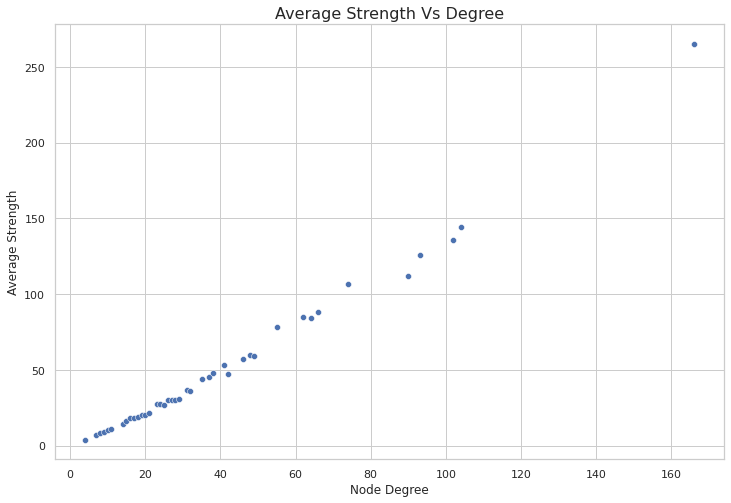

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style='whitegrid')
fig = plt.gcf()

# Change seaborn plot size
fig.set_size_inches(12, 8)

p=sns.scatterplot(x='node_degree', 
                y='avg_node_strength', 
                data=df_scatter_plot)

p.set_xlabel("Node Degree", fontsize = 12)
p.set_ylabel("Average Strength", fontsize = 12)
plt.title("Average Strength Vs Degree", size = 16)

# Converting to HTML

In [29]:
!jupyter nbconvert --to html Project_3_Task_1_Group_76.ipynb